In [2]:
#Import necessary libraries
import pandas as pd  # For data manipulation
import numpy as np  # For numerical operations
#For visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Load the Dataset
df=pd.read_csv("Amazon-Products.csv")

In [4]:
# To verify the Dataset
# Checked First few rows
df.head()

,Unnamed: 0,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price
0,0,Lloyd 1.5 Ton 3 Star Inverter Split Ac (5 In 1...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/31UISB90sY...,https://www.amazon.in/Lloyd-Inverter-Convertib...,4.2,"2,255","₹32,999","₹58,990"
1,1,LG 1.5 Ton 5 Star AI DUAL Inverter Split AC (C...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Convertible-Anti-Viru...,4.2,"2,948","₹46,490","₹75,990"
2,2,LG 1 Ton 4 Star Ai Dual Inverter Split Ac (Cop...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Inverter-Convertible-...,4.2,"1,206","₹34,490","₹61,990"
3,3,LG 1.5 Ton 3 Star AI DUAL Inverter Split AC (C...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Convertible-Anti-Viru...,4.0,69,"₹37,990","₹68,990"
4,4,Carrier 1.5 Ton 3 Star Inverter Split AC (Copp...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/41lrtqXPiW...,https://www.amazon.in/Carrier-Inverter-Split-C...,4.1,630,"₹34,490","₹67,790"


In [5]:
# To Check dataset info (columns, data types, missing values)
df.info()
# For checking basic statistics
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551585 entries, 0 to 551584
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Unnamed: 0      551585 non-null  int64 
 1   name            551585 non-null  object
 2   main_category   551585 non-null  object
 3   sub_category    551585 non-null  object
 4   image           551585 non-null  object
 5   link            551585 non-null  object
 6   ratings         375791 non-null  object
 7   no_of_ratings   375791 non-null  object
 8   discount_price  490422 non-null  object
 9   actual_price    533772 non-null  object
dtypes: int64(1), object(9)
memory usage: 42.1+ MB


,Unnamed: 0
count,551585.000000
mean,7006.200471
std,5740.835523
min,0.000000
25%,1550.000000
50%,5933.000000
75%,11482.000000
max,19199.000000


##  Key Observations

###  Unnecessary Column:
- `Unnamed: 0` is just an index and can be dropped.

###  Data Type Issues:
- `ratings`, `no_of_ratings`, `discount_price`, and `actual_price` should be numerical but are stored as objects (strings).

###  Missing Values:
- `ratings` & `no_of_ratings` --> **31.8% missing**
- `discount_price` --> **11.1% missing**
- `actual_price` --> **3.2% missing**

In [6]:
# To handle all the observed issues 
#Drop the Unnamed Column
df.drop(columns=['Unnamed: 0'], inplace=True)

In [7]:
# Checking again to verify that Unnamed column has been dropped or not
df.head()

,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price
0,Lloyd 1.5 Ton 3 Star Inverter Split Ac (5 In 1...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/31UISB90sY...,https://www.amazon.in/Lloyd-Inverter-Convertib...,4.2,"2,255","₹32,999","₹58,990"
1,LG 1.5 Ton 5 Star AI DUAL Inverter Split AC (C...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Convertible-Anti-Viru...,4.2,"2,948","₹46,490","₹75,990"
2,LG 1 Ton 4 Star Ai Dual Inverter Split Ac (Cop...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Inverter-Convertible-...,4.2,"1,206","₹34,490","₹61,990"
3,LG 1.5 Ton 3 Star AI DUAL Inverter Split AC (C...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Convertible-Anti-Viru...,4.0,69,"₹37,990","₹68,990"
4,Carrier 1.5 Ton 3 Star Inverter Split AC (Copp...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/41lrtqXPiW...,https://www.amazon.in/Carrier-Inverter-Split-C...,4.1,630,"₹34,490","₹67,790"


In [8]:
#Rupee sign is persent with prices that can cause an error furthur so first remove it 
df['discount_price'] = df['discount_price'].str.replace('₹','',regex=True)
df['actual_price'] = df['actual_price'].str.replace('₹','',regex=True)

# Removed commas from the 'discount_price' column to ensure it can be converted to a numerical format correctly
df['discount_price'] = df['discount_price'].str.replace(',','',regex=True)
df['actual_price'] = df['actual_price'].str.replace(',','',regex=True)

df.head()

,name,main_category,sub_category,image,link,ratings,no_of_ratings,discount_price,actual_price
0,Lloyd 1.5 Ton 3 Star Inverter Split Ac (5 In 1...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/31UISB90sY...,https://www.amazon.in/Lloyd-Inverter-Convertib...,4.2,"2,255",32999,58990
1,LG 1.5 Ton 5 Star AI DUAL Inverter Split AC (C...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Convertible-Anti-Viru...,4.2,"2,948",46490,75990
2,LG 1 Ton 4 Star Ai Dual Inverter Split Ac (Cop...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Inverter-Convertible-...,4.2,"1,206",34490,61990
3,LG 1.5 Ton 3 Star AI DUAL Inverter Split AC (C...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/51JFb7FctD...,https://www.amazon.in/LG-Convertible-Anti-Viru...,4.0,69,37990,68990
4,Carrier 1.5 Ton 3 Star Inverter Split AC (Copp...,appliances,Air Conditioners,https://m.media-amazon.com/images/I/41lrtqXPiW...,https://www.amazon.in/Carrier-Inverter-Split-C...,4.1,630,34490,67790


In [9]:
# Now to handle Data Type issue
# Convert ratings to float (ratings usually have decimal values)
df['ratings'] = pd.to_numeric(df['ratings'], errors='coerce').astype(float)
# Convert no_of_ratings, discount_price, and actual_price to integers & handling not a number values with memory optimization
df['no_of_ratings'] = pd.to_numeric(df['no_of_ratings'],errors='coerce').fillna(0).astype(np.int32)
df['discount_price'] = pd.to_numeric(df['discount_price'],errors='coerce').fillna(0).astype(np.int32)
df['actual_price'] = pd.to_numeric(df['actual_price'],errors='coerce').fillna(0).astype(np.int32)

In [10]:
# Verify the changes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551585 entries, 0 to 551584
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   name            551585 non-null  object 
 1   main_category   551585 non-null  object 
 2   sub_category    551585 non-null  object 
 3   image           551585 non-null  object 
 4   link            551585 non-null  object 
 5   ratings         369558 non-null  float64
 6   no_of_ratings   551585 non-null  int32  
 7   discount_price  551585 non-null  int32  
 8   actual_price    551585 non-null  int32  
dtypes: float64(1), int32(3), object(5)
memory usage: 31.6+ MB


In [11]:
#After sorting this issue next 
#Checking for the outliers in different-different columns
#Checking for negative or extreme values in pricing
print("Min Discount Price:", df['discount_price'].min())
print("Max Discount Price:",df['discount_price'].max())
print("Min Actual Price:",df['actual_price'].min())
print("Max Actual Price:",df['actual_price'].max())
# Checking for unreal ratings
print("Min Rating:",df['ratings'].min())
print("Max Rating:",df['ratings'].max())

Min Discount Price: 0
Max Discount Price: 1249990
Min Actual Price: 0
Max Actual Price: 2147483647
Min Rating: 1.0
Max Rating: 5.0


#### **Pricing Analysis**
- **Minimum Discount Price:** 0  
- **Maximum Discount Price:** 1,249,990 (Unrealistically high)
- **Minimum Actual Price:** 0  (Unrealistically)
- **Maximum Actual Price:** 2147483647 (Unrealistically high)

#### **Ratings Analysis**
- **Minimum Rating:** 1.0  
- **Maximum Rating:** 5.0 (Within expected range)

 **Observations:**  
- The **maximum actual price** & **Maximum Discount Price:** appears suspiciously high, potentially an outlier.
- The **Minimum Actual Price** is 0 that's 


In [12]:
# Set a threshold for extreme prices
extreme_actual_price = df[df['actual_price'] > 1000000]
extreme_discount_price = df[df['discount_price'] > 500000]

# Print the count of extreme values
print("Number of extreme actual prices:", extreme_actual_price.shape[0])
print("Number of extreme discount prices:", extreme_discount_price.shape[0])


Number of extreme actual prices: 7
Number of extreme discount prices: 1


In [13]:
# Display some extreme actual price values
print("Extreme Actual Price Products:")
display(extreme_actual_price[['name', 'actual_price', 'discount_price']].head(10))

# Display some extreme discount price values
print("Extreme Discount Price Products:")
display(extreme_discount_price[['name', 'actual_price', 'discount_price']].head(10))
#verify the prices 

Extreme Actual Price Products:


,name,actual_price,discount_price
194625,"Marutivilla Insect Killer, Mosquito Killer Lig...",2147483647,589
311949,USPTO डायमंड वन स्टोन D Colour Genuine 3 Carat...,1200000,406009
334263,USPTO डायमंड वन स्टोन D Colour Genuine 3 Carat...,1200000,406009
390319,USPTO डायमंड वन स्टोन D Colour Genuine 3 Carat...,1200000,406009
390351,USPTO डायमंड वन स्टोन D Colour Genuine 3 Carat...,1200000,406009
402750,Clovia Women's Activewear Ankle Length Printed...,61082990,688
498818,Samsung 214 cm (85 inches) 8K Ultra HD Smart N...,1594900,1249990


Extreme Discount Price Products:


,name,actual_price,discount_price
498818,Samsung 214 cm (85 inches) 8K Ultra HD Smart N...,1594900,1249990


In [14]:
#Fixed the incorrect discount price for the Samsung TV
#The actual price is legitimate, but the discount price has an extra zero (1249990 instead of 124999).
df.loc[df['name'].str.contains("Samsung 214 cm", case=False, na=False), 'discount_price'] = 124999

# Remove products with unrealistic actual prices
# The "Marutivilla Insect Killer" and "USPTO Diamond" products have incorrect pricing, so  removed them.
df = df.drop(df[df['name'].isin([
    'Marutivilla Insect Killer, Mosquito Killer Light, 360° Silent Suction Mosquito Killer Trap Zapper Insect Trap Mosquito Rep...',
    "Clovia Women's Activewear Ankle Length Printed Tights"
])].index)


In [15]:
#Verified the fixes
print("Min Discount Price:", df['discount_price'].min())
print("Max Discount Price:",df['discount_price'].max())
print("Min Actual Price:",df['actual_price'].min())
print("Max Actual Price:",df['actual_price'].max())

Min Discount Price: 0
Max Discount Price: 499999
Min Actual Price: 0
Max Actual Price: 1594900


In [16]:
# Checking for the number of products with both actual price and discount price zero
zero_price_products = df[(df['actual_price'] == 0) & (df['discount_price'] == 0)]
print(f"Number of products with both actual price and discount price as 0: {len(zero_price_products)}")
print(zero_price_products.head())

Number of products with both actual price and discount price as 0: 17815
                                                  name main_category  \
76   LG 1.5 Ton 3 Star Hot & Cold DUAL Inverter Spl...    appliances   
100  Hitachi 1.5 Ton 5 Star Inverter Split AC (Copp...    appliances   
114  Panasonic 1.5 Ton 4 Star Wi-Fi Twin-Cool Inver...    appliances   
144  Daikin 1.5 Ton 4 Star Hot & Cold Heat Pump Inv...    appliances   
146  LG 1.5 Ton 5 Star AI DUAL Inverter Wi-Fi Split...    appliances   

         sub_category                                              image  \
76   Air Conditioners  https://m.media-amazon.com/images/I/51hbo8yQ1E...   
100  Air Conditioners  https://m.media-amazon.com/images/I/41AY1pk5oR...   
114  Air Conditioners  https://m.media-amazon.com/images/I/41Edvsb7Gh...   
144  Air Conditioners  https://m.media-amazon.com/images/W/IMAGERENDE...   
146  Air Conditioners  https://m.media-amazon.com/images/W/IMAGERENDE...   

                                     

# **Handling Missing Prices in the Dataset**

## **Problem**
Some products in the dataset have both `actual_price` and `discount_price` set to **0**. This leads to inconsistencies in price-related analysis. To fix this, first replace these zero values with the **average prices** of products in the same category.

---

## **Solution Approach**
1. **Compute Mean Prices by Category**  
   - Group the dataset by `main_category`  
   - Calculate the mean of `actual_price` and `discount_price`, ignoring zero values  
   - Store these values in a dictionary for easy mapping  

2. **Replace Zero Prices with Category-Wise Averages**  
   - Identify rows where both `actual_price` and `discount_price` are 0  
   - Use the computed category-wise mean prices to fill these missing values  
   - Ensure data type compatibility by converting prices to integers

---

In [17]:
# Compute mean actual and discount prices for each main category (ignoring zero values)
category_mean_prices = df[df['actual_price'] > 0].groupby('main_category')[['actual_price', 'discount_price']].mean()
print(category_mean_prices)


                         actual_price  discount_price
main_category                                        
accessories               8136.304720     5310.228864
appliances                8132.084850     5126.006480
bags & luggage            4047.896814     1788.745442
beauty & health           1156.556015      623.633730
car & motorbike           1769.985545      905.140976
grocery & gourmet foods    586.330286      354.845826
home & kitchen            1802.352059      881.023770
home, kitchen, pets       4468.117647     3437.882353
industrial supplies       3446.659352     2019.671571
kids' fashion             1659.477737      757.823716
men's clothing            1816.717856      834.014164
men's shoes               3853.468950     1558.791189
music                     5621.808285     3504.523121
pet supplies              1148.227918      638.817789
sports & fitness          3099.217516     1601.420013
stores                    4959.704645     1082.281283
toys & baby products      18

In [18]:
# Converted mean prices to integer before mapping
actual_price_map = category_mean_prices['actual_price'].astype(int).to_dict()
discount_price_map = category_mean_prices['discount_price'].astype(int).to_dict()

# Find rows where both actual and discount prices are 0
mask = (df['actual_price'] == 0) & (df['discount_price'] == 0)

# Assign the integer values to the DataFrame
df.loc[mask, 'actual_price'] = df.loc[mask, 'main_category'].map(actual_price_map).astype(int)
df.loc[mask, 'discount_price'] = df.loc[mask, 'main_category'].map(discount_price_map).astype(int)


/var/folders/lk/71y74q0d1vvb1rq2dd161xrm0000gn/T/ipykernel_90070/898990975.py:9: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[8132 8132 8132 ... 3099 3099 3099]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  df.loc[mask, 'actual_price'] = df.loc[mask, 'main_category'].map(actual_price_map).astype(int)
/var/folders/lk/71y74q0d1vvb1rq2dd161xrm0000gn/T/ipykernel_90070/898990975.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[5126 5126 5126 ... 1601 1601 1601]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  df.loc[mask, 'discount_price'] = df.loc[mask, 'main_category'].map(discount_price_map).astype(int)


In [19]:
#Again checking for the number of products with both actual price and discount price zero to verify
zero_price_products = df[(df['actual_price'] == 0) & (df['discount_price'] == 0)]
#print(zero_price_products.head())
print(f"Number of products with both actual price and discount price as 0: {len(zero_price_products)}")


Number of products with both actual price and discount price as 0: 0


## **next checking for duplicates**

In [20]:
exact_duplicates = df[df.duplicated()]
print("Number of exact duplicate rows:", len(exact_duplicates))


Number of exact duplicate rows: 0


## **Missing Values**

In [21]:
#Finalizing the Cleaned DataFrame
#Confirm Data Types are Correct
print(df.dtypes)
#checking for remening missing values
print(df.isnull().sum())
# checking prices are logical
invalid_prices = df[(df['actual_price'] < df['discount_price']) | (df['actual_price'] == 0)]
print(f"Number of invalid price records: {len(invalid_prices)}")



name               object
main_category      object
sub_category       object
image              object
link               object
ratings           float64
no_of_ratings       int32
discount_price      int64
actual_price        int64
dtype: object
name                   0
main_category          0
sub_category           0
image                  0
link                   0
ratings           182027
no_of_ratings          0
discount_price         0
actual_price           0
dtype: int64
Number of invalid price records: 1


##                       **Plot the missing values**

<Axes: >

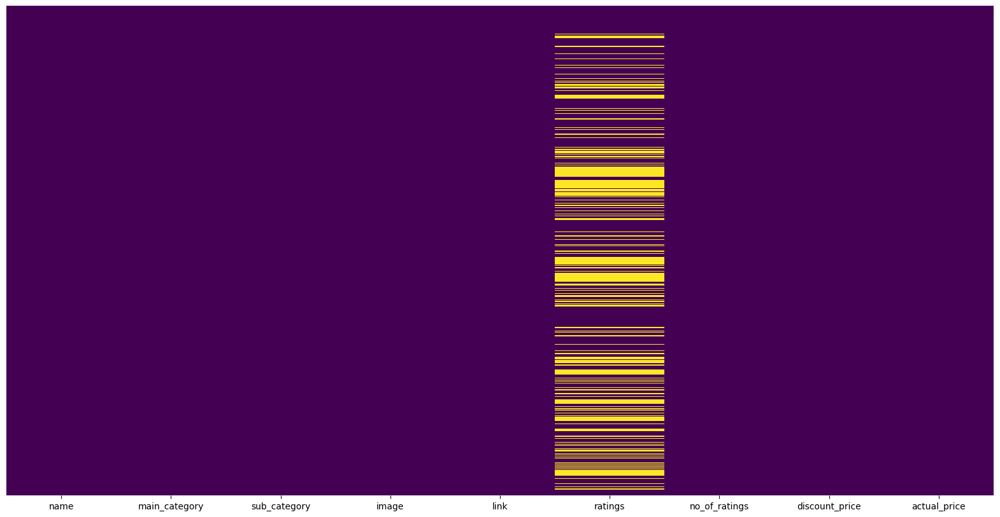

In [22]:
# make a figure size
plt.figure(figsize=(20, 10))
# plot the null values in each column
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis') 

## **Percentage of Missing Values in each Column**

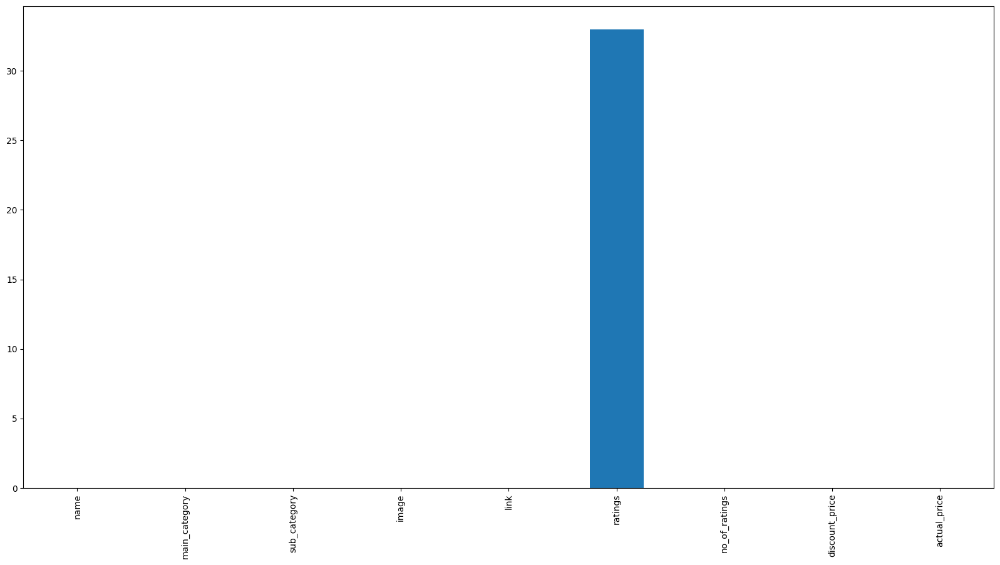

In [23]:
plt.figure(figsize=(20,10))
Missing_values_percentage=df.isnull().sum()/ len(df) * 100
Missing_values_percentage.plot(kind='bar')
plt.show()

## Not assigning any value to the missing ratings of the products because these products are not yet rated 

In [24]:
# Checking for the price record where actual price is less than discounted price
invalid_price_record = df[(df['actual_price'] < df['discount_price']) | (df['actual_price'] == 0)]
print(invalid_price_record)


                                                     name  \
499310  Samsung 214 cm (85 inches) 4K Ultra HD Smart N...   

              main_category sub_category  \
499310  tv, audio & cameras  Televisions   

                                                    image  \
499310  https://m.media-amazon.com/images/I/91b1B9Pjd2...   

                                                     link  ratings  \
499310  https://www.amazon.in/Samsung-inches-Ultra-Sma...      4.0   

        no_of_ratings  discount_price  actual_price  
499310             18          124999             0  


In [25]:
# Dropping the product where actual_price is 0 or less than discount_price because there is only one product
df = df[~((df['actual_price'] < df['discount_price']) | (df['actual_price'] == 0))]

# Verify removal
print("Number of invalid price records after removal:", 
      df[(df['actual_price'] < df['discount_price']) | (df['actual_price'] == 0)].shape[0])


Number of invalid price records after removal: 0


- **After cleaning and organising data now move ahead for analysis**

In [26]:
# Compute basic statistics for numerical columns
stats = df[['ratings', 'no_of_ratings', 'discount_price', 'actual_price']].describe()

# the summary statistics
print(stats)


             ratings  no_of_ratings  discount_price  actual_price
count  369555.000000  551582.000000    551582.00000  5.515820e+05
mean        3.832318      54.647617      2426.00048  4.473854e+03
std         0.756098     141.588566      8796.04622  1.268882e+04
min         1.000000       0.000000         0.00000  4.000000e+00
25%         3.500000       0.000000       330.00000  9.990000e+02
50%         3.900000       2.000000       625.00000  1.599000e+03
75%         4.300000      27.000000      1396.00000  3.299000e+03
max         5.000000     999.000000    499999.00000  1.594900e+06


In [27]:
# Group by main_category and calculate summary statistics
price_summary = df.groupby('main_category')[['actual_price', 'discount_price']].describe()
print(price_summary)


                        actual_price                                     \
                               count         mean           std     min   
main_category                                                             
accessories                 116141.0  8136.291680  19827.642716     4.0   
appliances                   33096.0  8132.080312  15810.639071    59.0   
bags & luggage               10416.0  4047.859447   7185.179305    80.0   
beauty & health              10122.0  1156.544260   2339.281213    10.0   
car & motorbike               7080.0  1769.972599   3729.011583    33.0   
grocery & gourmet foods       3312.0   586.327295    982.561537    10.0   
home & kitchen               14567.0  1802.349763   3838.898050    25.0   
home, kitchen, pets             24.0  4468.083333   1847.000787  1499.0   
industrial supplies           4104.0  3446.644250   7340.266987    54.0   
kids' fashion                13488.0  1659.467749  10703.239345    94.0   
men's clothing           

##  Visualization

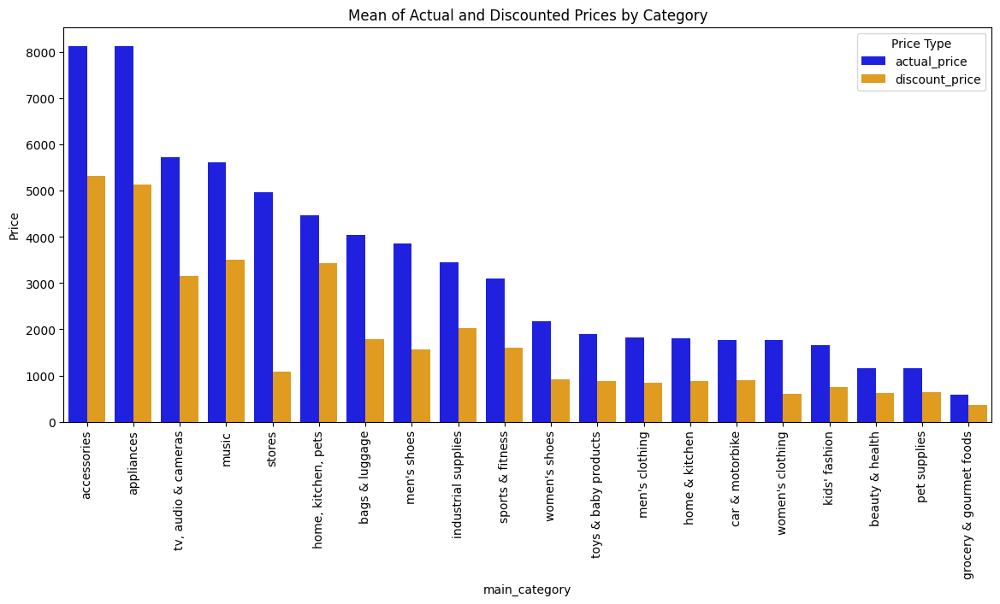

In [28]:
# Grouped the dataframe
df_grouped = df.groupby("main_category")[["actual_price", "discount_price"]].mean().sort_values('actual_price',ascending=False).reset_index()

# Melted the DataFrame for visualization
df_melted = df_grouped.melt(id_vars="main_category", var_name="Price Type", value_name="Price")

# Plot grouped bar chart
plt.figure(figsize=(14, 6))
sns.barplot(data=df_melted, x="main_category", y="Price", hue="Price Type", palette=["blue", "orange"])

plt.title("Mean of Actual and Discounted Prices by Category")
plt.ylabel("Price")
plt.xticks(rotation=90)
plt.legend(title="Price Type")
plt.show()


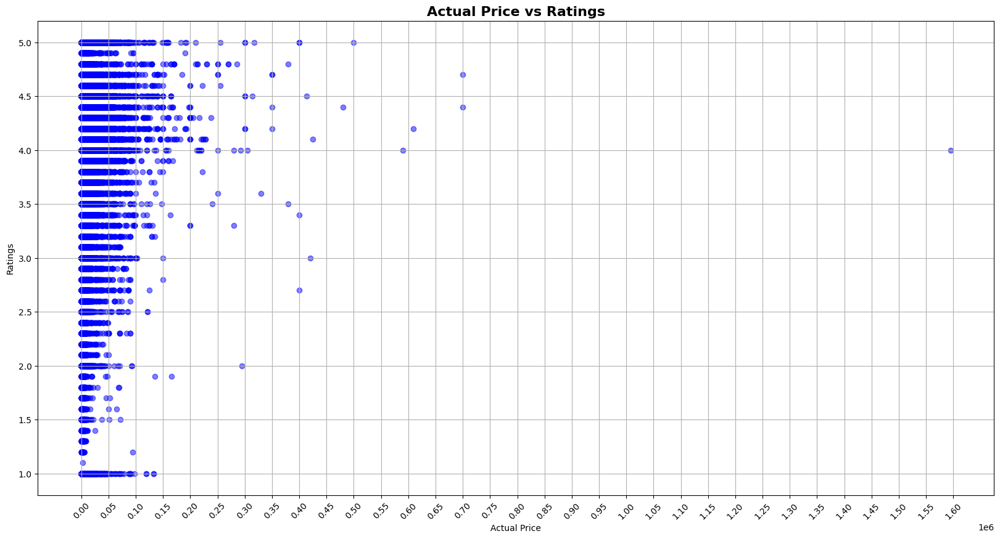

In [29]:
# Set figure size
plt.figure(figsize=(20, 10))  
plt.scatter(df['actual_price'], df['ratings'], alpha=0.5, color='blue')

# Setting x-axis ticks interval
x_ticks = np.arange(0, df['actual_price'].max() + 10000, 50000)
plt.xticks(x_ticks, rotation=45)
# Plot Scatter Chart
plt.xlabel("Actual Price")
plt.ylabel("Ratings")
plt.title("Actual Price vs Ratings",fontweight='bold',fontsize=16)
# Added grid for better readability
plt.grid(True)  
plt.show()


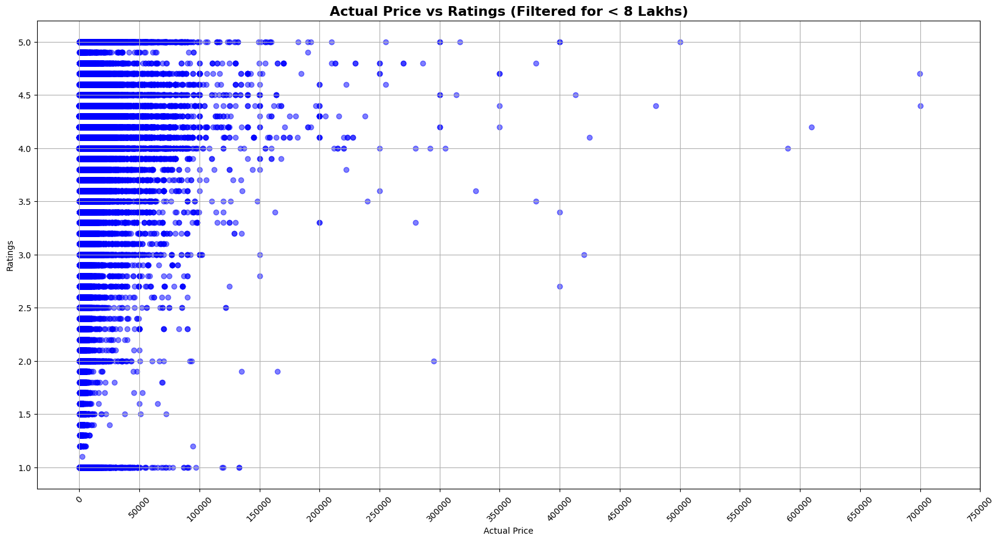

In [30]:
# Filter the data for products with actual price < 8,00,000
df_filtered = df[df['actual_price'] < 800000]
# Set figure size
plt.figure(figsize=(20, 10))  
plt.scatter(df_filtered['actual_price'], df_filtered['ratings'], alpha=0.5, color='blue')

# Setting x-axis ticks interval
x_ticks = np.arange(0, df_filtered['actual_price'].max() + 50000, 50000)
plt.xticks(x_ticks, rotation=45)

plt.xlabel("Actual Price")
plt.ylabel("Ratings")
plt.title("Actual Price vs Ratings (Filtered for < 8 Lakhs)",fontweight='bold',fontsize=16)
plt.grid(True)  # Add grid for better readability
plt.show()


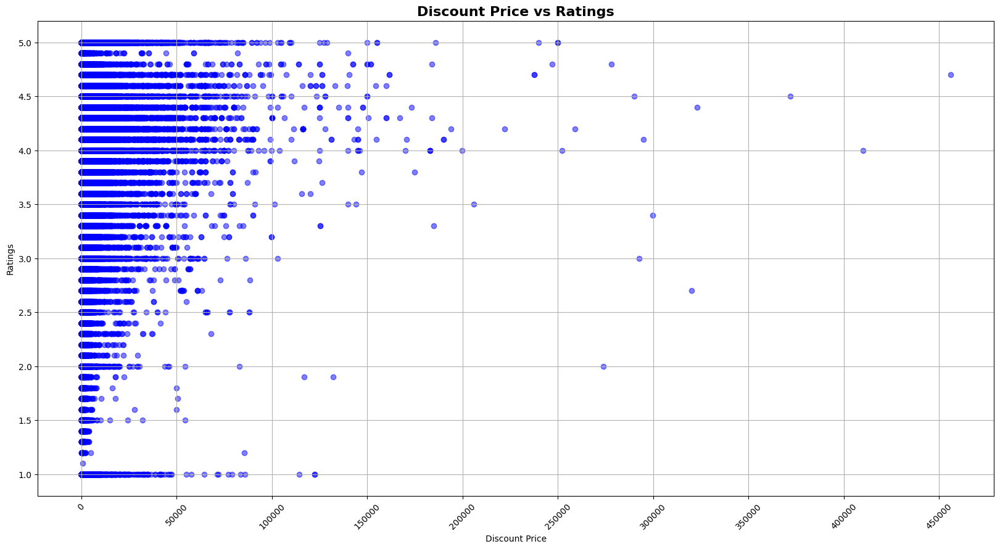

In [31]:
# Set figure size
plt.figure(figsize=(20, 10))
plt.scatter(df['discount_price'], df['ratings'], alpha=0.5, color='blue') 

# Setting x-axis ticks interval
x_ticks = np.arange(0, df['discount_price'].max(), 50000)
plt.xticks(x_ticks, rotation=45)

plt.xlabel("Discount Price")
plt.ylabel("Ratings")
plt.title("Discount Price vs Ratings",fontweight='bold',fontsize=16)
# Added grid for better readability
plt.grid(True)  
plt.show()


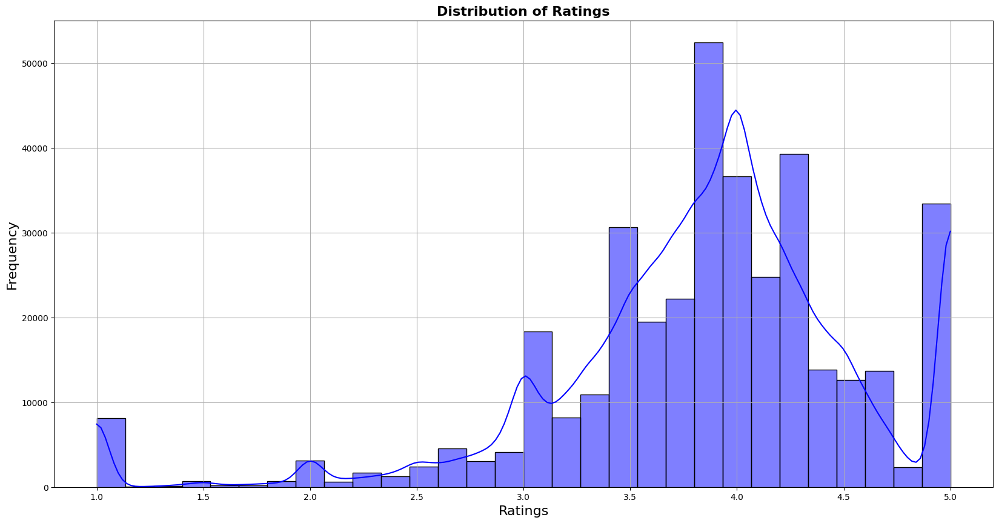

In [32]:
# Set figure size
plt.figure(figsize=(20, 10))
df_corr = df.dropna(subset=["ratings", "no_of_ratings"])
#Plot Histogram
sns.histplot(df_corr["ratings"], bins=30, kde=True, color='blue') 
plt.xlabel("Ratings", fontsize=16)
plt.ylabel("Frequency", fontsize=16)
plt.title("Distribution of Ratings", fontweight='bold', fontsize=16)
plt.grid(True)
plt.show()


## Top 10 Categories by 

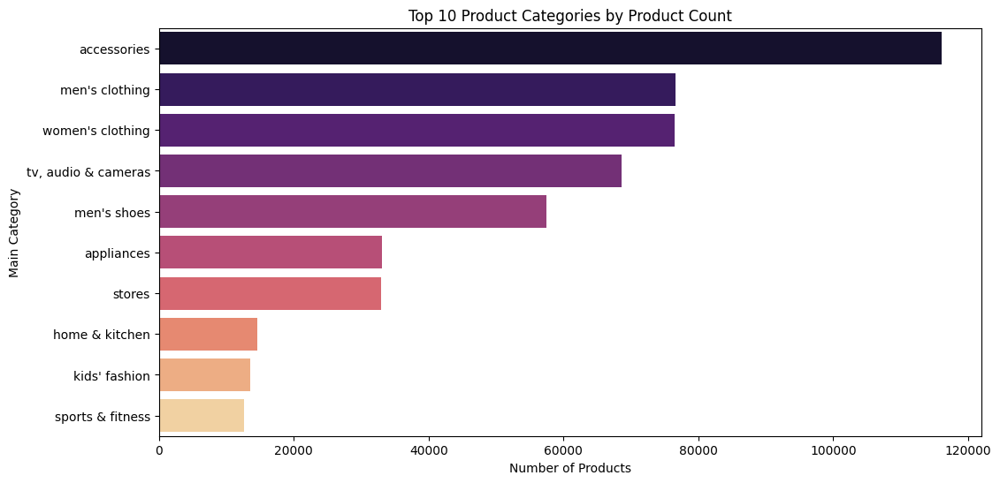

In [33]:
# Count the number of products in each main category
category_counts = df["main_category"].value_counts().head(10)

# Plot a bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=category_counts.values, y=category_counts.index,hue=category_counts.index, palette="magma")

# Add labels and title
plt.xlabel("Number of Products")
plt.ylabel("Main Category")
plt.title("Top 10 Product Categories by Product Count")

# Show the plot
plt.show()


## Top selling categories

/var/folders/lk/71y74q0d1vvb1rq2dd161xrm0000gn/T/ipykernel_90070/1354155445.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_top_subs = (df_top_subs.groupby("main_category", group_keys=False).apply(lambda x: x.nlargest(3, "no_of_ratings")).reset_index(drop=True))


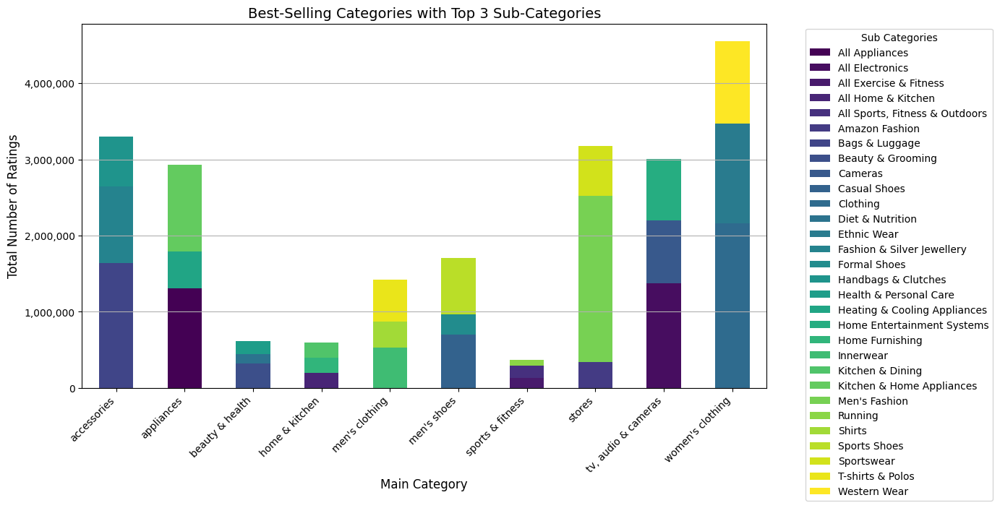

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

# Get top 10 best-selling main categories
top_categories = df.groupby("main_category")["no_of_ratings"].sum().nlargest(10).index

# Filtered dataset for only these categories
df_filtered = df[df["main_category"].isin(top_categories)]

# Get the top 3 sub-categories within each main category
df_top_subs = df_filtered.groupby(["main_category", "sub_category"])["no_of_ratings"].sum().reset_index()
df_top_subs = (df_top_subs.groupby("main_category", group_keys=False).apply(lambda x: x.nlargest(3, "no_of_ratings")).reset_index(drop=True))

# Pivot table for stacked bar plot
pivot_df = df_top_subs.pivot(index="main_category", columns="sub_category", values="no_of_ratings").fillna(0)

# Plot stacked bar chart
fig, ax = plt.subplots(figsize=(14, 7))  # Increased figure size
pivot_df.plot(kind="bar", stacked=True, ax=ax, colormap="viridis")  # Better colormap

# Formatting
ax.set_title("Best-Selling Categories with Top 3 Sub-Categories", fontsize=14)
ax.set_xlabel("Main Category", fontsize=12)
ax.set_ylabel("Total Number of Ratings", fontsize=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=10)

# Format Y-axis to display large numbers properly (e.g., 100K, 1M)
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{int(x):,}"))

# Used plt.yticks() to set properly spaced y-axis labels
plt.yticks(rotation=0, fontsize=10)  # Ensures y-axis labels are readable and properly formatted

# Adjusted legend position
ax.legend(title="Sub Categories", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)

# Show plot

plt.grid(True,axis='y')
plt.tight_layout()
plt.show()



## **To make Interactive chart to the above Chart Use Below mentioned code**

In [35]:
import pandas as pd
import plotly.express as px

# Prepared data in long format for Plotly
df_top_subs["main_category_sub"] = df_top_subs["main_category"] + " - " + df_top_subs["sub_category"]

# Created interactive stacked bar chart
fig = px.bar(
    df_top_subs, 
    x="main_category", 
    y="no_of_ratings", 
    color="sub_category", 
    text="no_of_ratings",
    title="Best-Selling Categories with Top 3 Sub-Categories",
    labels={"no_of_ratings": "Total Ratings", "main_category": "Main Category"},
    barmode="stack",
    hover_name="main_category_sub",
    color_discrete_sequence=px.colors.qualitative.Vivid
)

# Formated Y-axis to display large numbers properly
fig.update_yaxes(tickformat=",")


fig.update_layout(
    xaxis_tickangle=-45,
    showlegend=True,
    margin=dict(t=50, b=100),
    width=1120,  # Set width (in pixels)
    height=600   # Set height (in pixels)
)

# Show interactive plot
fig.show()


Correlation between ratings and number of ratings: 0.07


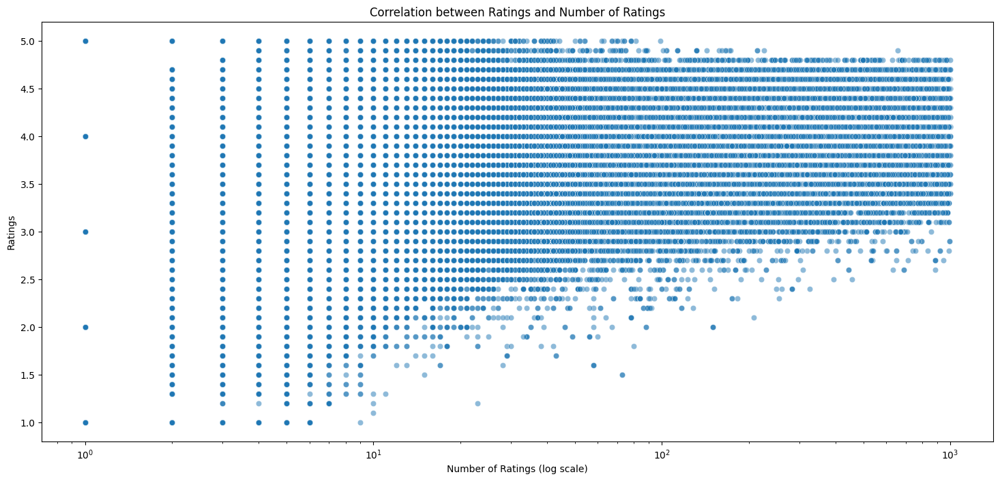

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Drop missing values
df_corr = df.dropna(subset=["ratings", "no_of_ratings"])

# Computed Pearson correlation
correlation = df_corr["ratings"].corr(df_corr["no_of_ratings"])
print(f"Correlation between ratings and number of ratings: {correlation:.2f}")

# Scatter plot to visualize the relationship
plt.figure(figsize=(18, 8))
sns.scatterplot(x=df_corr["no_of_ratings"], y=df_corr["ratings"], alpha=0.5)
#Used log scale for better visualization
plt.xscale("log")  
plt.xlabel("Number of Ratings (log scale)")
plt.ylabel("Ratings")
plt.title("Correlation between Ratings and Number of Ratings")
plt.show()


In [37]:
# Find top-rated products (minimum 900 reviews for reliability)
top_rated_products = df_corr[df_corr["no_of_ratings"]>900].nlargest(10, "ratings")[["name", "ratings", "no_of_ratings"]]
print("Top 10 Rated Products:\n", top_rated_products)

# Find most-reviewed products
most_reviewed_products = df_corr.nlargest(10, "no_of_ratings")[["name", "ratings", "no_of_ratings"]]
print("Top 10 Most Reviewed Products:\n", most_reviewed_products)

Top 10 Rated Products:
                                                      name  ratings  \
43125   RUSTIC TOWN Leather Pencil Case Holder - Pen P...      4.8   
48521           Victorinox Swiss Army Knife - Spartan Red      4.8   
65219   SAMSUNG PRO Endurance 32GB MicroSDXC Memory Ca...      4.8   
68858                Lowepro Lens Case 13 x 32 cm (Black)      4.8   
77269   SAMSUNG PRO Endurance 32GB MicroSDXC Memory Ca...      4.8   
254382  Design Toscano Chicory The Chimpanzee Baby Mon...      4.8   
254600  Nirvana Class Wooden Crafted Coaster Set Of 6 ...      4.8   
264144  Luxja Projector Case, Projector Bag with Acces...      4.8   
321991  KHOCOEE 24 Gemstone Bottles Chip Crystal Heali...      4.8   
403414  RUSTIC TOWN Leather Pencil Case Holder - Pen P...      4.8   

        no_of_ratings  
43125             916  
48521             968  
65219             972  
68858             933  
77269             972  
254382            952  
254600            998  
264144       

/var/folders/lk/71y74q0d1vvb1rq2dd161xrm0000gn/T/ipykernel_90070/2226923656.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



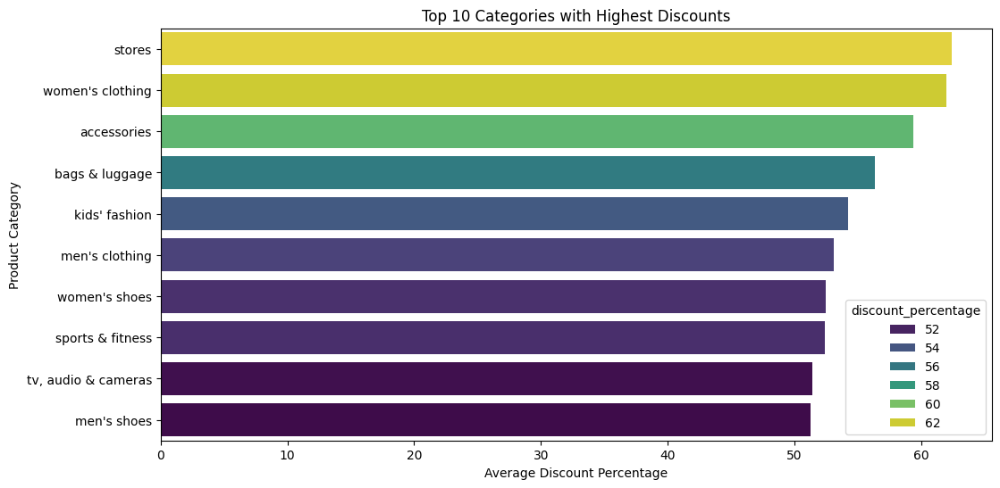

In [38]:
# Calculated discount percentage
df_corr.loc[:,"discount_percentage"] = ((df_corr["actual_price"] - df_corr["discount_price"]) / df_corr["actual_price"]) * 100

# Group by category and calculate average discount
avg_discount_per_category = df_corr.groupby("main_category")["discount_percentage"].mean().reset_index()

# Sort and display top 10 categories by discount percentage
top_discount_categories = avg_discount_per_category.sort_values(by="discount_percentage", ascending=False).head(10)


# Visualization
plt.figure(figsize=(12,6))
sns.barplot(data=top_discount_categories, y="main_category", x="discount_percentage",hue="discount_percentage", palette="viridis")
plt.xlabel("Average Discount Percentage")
plt.ylabel("Product Category")
plt.title("Top 10 Categories with Highest Discounts")
plt.show()


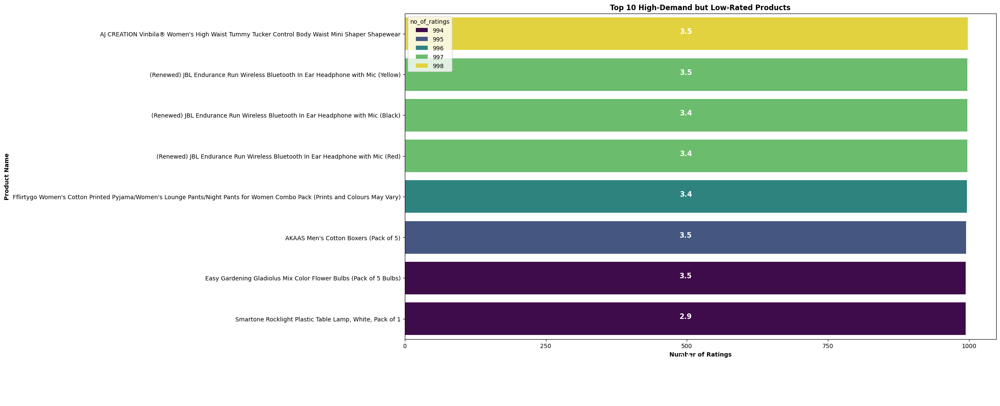

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select products with low ratings (≤3.5) and high reviews (top 10%)
high_demand_low_rated = df_corr[
    (df_corr["ratings"] <= 3.5) & 
    (df_corr["no_of_ratings"] >= df_corr["no_of_ratings"].quantile(0.90))
]

# Get the top 10 such products
top_10_low_rated = high_demand_low_rated.nlargest(10, "no_of_ratings")

# Plot bar chart
plt.figure(figsize=(18,10))
ax = sns.barplot(data=top_10_low_rated, y="name", x="no_of_ratings",hue='no_of_ratings', palette="viridis")

# Add text labels with ratings inside the bars
for index, row in enumerate(top_10_low_rated.itertuples()):
    ax.text(row.no_of_ratings * 0.5, index, f"{row.ratings:.1f}", color="white", ha="center",fontsize=12, fontweight="bold")

# Set x-axis ticks at intervals of 250
plt.xticks(range(0, top_10_low_rated["no_of_ratings"].max() + 250, 250))

plt.xlabel("Number of Ratings",fontweight="bold")
plt.ylabel("Product Name",fontweight="bold")
plt.title("Top 10 High-Demand but Low-Rated Products",fontweight="bold")

plt.show()


In [40]:
import pandas as pd
import plotly.express as px

# Aggregated data
category_analysis = df_corr.groupby("main_category").agg(
    product_count=("name", "count"),
    total_ratings=("no_of_ratings", "sum")
).reset_index()

# Create interactive scatter plot
fig = px.scatter(
    category_analysis, 
    x="product_count", 
    y="total_ratings", 
    size="total_ratings",
    color="main_category",  
    hover_name="main_category",  # Show category name on hover
    title="Low-Competition vs. High-Demand Product Categories",
    labels={"product_count": "Number of Products (Competition)", 
            "total_ratings": "Total Ratings (Demand)"},
    size_max=40,  # Adjust max bubble size
)

# Format y-axis with commas
fig.update_yaxes(tickformat=",")  
# Adjust figure size
fig.update_layout(
    width=1120,  # Set width (in pixels)
    height=600)   # Set height (in pixels)
# Show interactive plot
fig.show()


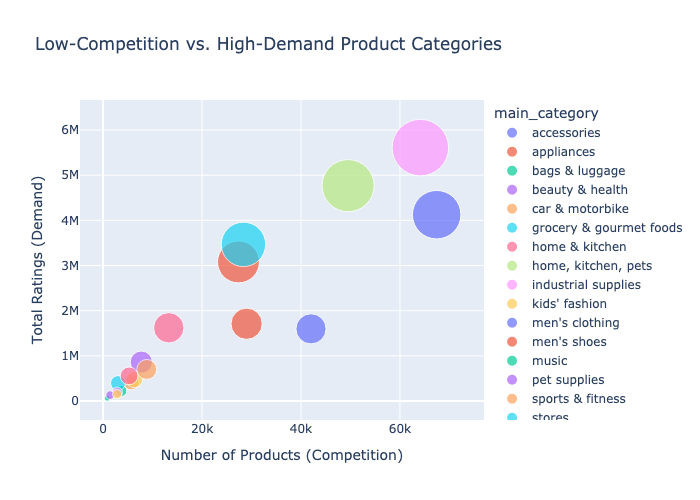

In [41]:
import pandas as pd
import plotly.express as px

# Aggregated data
category_analysis = df_corr.groupby("main_category").agg(
    product_count=("name", "count"),
    total_ratings=("no_of_ratings", "sum")
).reset_index()

# Create scatter plot
fig = px.scatter(
    category_analysis, 
    x="product_count", 
    y="total_ratings", 
    size="total_ratings",
    color="main_category",  
    hover_name="main_category",
    title="Low-Competition vs. High-Demand Product Categories",
    labels={"product_count": "Number of Products (Competition)", 
            "total_ratings": "Total Ratings (Demand)"},
    size_max=40,
)

# Save as a PNG (ensure Kaleido is installed)
file_path = "category_analysis.png"
fig.write_image(file_path)

# Verify the file exists
import os
if os.path.exists(file_path):
    from IPython.display import display, Image
    display(Image(file_path))
else:
    print("Error: Image file was not saved correctly.")
